# Project Name: Spotify 2017-2021 Daily Global Top 200 Analysis

**Project Scope:** Exploring Spotify 2017-2021 Daily Global Top 200 Data to Unearth Trends, Insights, and Business Value.

**Data Source:** https://www.kaggle.com/c0lydxmas/spotify-top-200-daily-global-2017-2021

**By:** Krishan Deo

**Date:** May 23rd, 2022

The following cells outline the ETL, Feature Engineering, Data Exploration, and Data Quality Assessment sections of the project. The ETL and Feature Engineering sections are contained within "Step 1" (Custom ETL Script). The Data Exploration and Data Quality Assessment sections are contained with "Step 3" (SweetViz).

ETL, Feature Engineering, Data Exploration, and Data Quality Assessment have been rolled into a single Jupyter notebook because they all tie together very closely in the iterative process of preparing the data for eventual model definition, training, and evaluation. In the case of this project, data exploration and data quality assessment could only be completed once the ETL and Feature Engineering steps were completed. This is because the individual JSON files first needed to be processed and concatenated into a single complete dataset (i.e. 2017,2018,2019,2020,2021).

The process of perfecting the ETL Script was iterative in nature as well, and there were multiple times where errors and necessary changes to Feature Engineering steps were discovered during the Model Definition stage. These discoveries required debugging and alteration of the ETL script, and subsequently required running all downstream processes all over again. It is for these reasons that ETL, Feature Engineering, Data Exploration, and Data Quality Assessment have been rolled into a single Jupyter notebook.

### Step 1: Custom ETL Script to Create 2017, 2018, 2019, 2020, and 2021 Datasets
In the below cell we can see my Custom ETL Script. After the imports and file paths are defined, the next step involves looping through each constituent JSON file and concatenating its contents to the current working dataframe. An initial normalization is done in this step as well. Once all the data is concatenated, the index is reset to free the “position” feature. After this, another round of normalization extracts nested JSON elements like “artist name”, “featured artist”, “featured artist 2”, and “featured artist 3”. Following this, datetime information is used to filter out songs not released in the chart year for the dataset (ex: removing songs released in 2016 from the 2017 dataset). Genre information is then extracted, sorted based on popularity within the chart year, and then replaced in place. Key null values are filtered out by removing records with missing “artist name” and “primary genre” values. Finally, the label is created, non-mandatory null values are imputed as “NABlankValue”, and columns with extraneous and non-essential data are dropped. The final resulting Dataframe is exported to CSV. This process is repeated for all five years (2017, 2018, 2019, 2020, and 2021).

In [ ]:
# ETL Script - Spotify Top 200 Data

# Imports

import pandas as pd
import glob, os, json
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth',1000)

# Nested JSON Parsing and Concatenation

json_dir = 'C:/Users/krishand/Downloads/SPOTIFY/archive/'

json_pattern = os.path.join(json_dir, '*.json')
file_list = glob.glob(json_pattern)

dfs = []
for file in file_list:
    with open(file, 'r', encoding='utf-8') as f:
        json_data = pd.json_normalize(json.loads(f.read()))
        json_data['site'] = file.rsplit("/", 1)[-1]
    dfs.append(json_data)
df = pd.concat(dfs)

df = df.reset_index()
df['index'] = df['index']+1
df = df.rename(columns={'index': 'position'})

# Extracting Artist Names

df2 = pd.json_normalize(df['artists'])[0].to_frame(name="js")
df3 = pd.json_normalize(df2['js'])['name']

df_2 = pd.json_normalize(df['artists'])[1].to_frame(name="js2")
df_3 = pd.json_normalize(df_2['js2'])['name']

df_2a = pd.json_normalize(df['artists'])[2].to_frame(name="js3")
df_3a = pd.json_normalize(df_2a['js3'])['name']

df_2b = pd.json_normalize(df['artists'])[3].to_frame(name="js4")
df_3b = pd.json_normalize(df_2b['js4'])['name']

df['artistname']=df3
df['featuredartist']=df_3
df['featuredartist2']=df_3a
df['featuredartist3']=df_3b

# Filtering Out Songs Released in a Different Year (1 Year Window)

df['time'] = pd.to_datetime(df['time'])
df['album.release_date'] = pd.to_datetime(df['album.release_date'])
df['chart_year'] = df['time'].dt.year
df['release_year'] = df['album.release_date'].dt.year

df = df[df['chart_year']==df['release_year']]

# Extract Initial Genre Information

df['numOfGenres'] = df['genres'].str.len()
df['primary_genre'] = df['genres'].str[0]
df['secondary_genre'] = df['genres'].str[1]
df['genre3'] = df['genres'].str[2]
df['genre4'] = df['genres'].str[3]
df['genre5'] = df['genres'].str[4]
df['genre6'] = df['genres'].str[5]
df['genre7'] = df['genres'].str[6]
df['genre8'] = df['genres'].str[7]
df['genre9'] = df['genres'].str[8]
df['genre10'] = df['genres'].str[9]
df['genre11'] = df['genres'].str[10]
df['genre12'] = df['genres'].str[11]
df['has_feature'] = pd.notnull(df['featuredartist'])
df['multigenre'] = pd.notnull(df['secondary_genre'])

# Feature Engineering - Sorting Genres By Popularity Instead of Alphabetic

genrecombine = pd.concat([df['primary_genre'], df['secondary_genre'],df['genre3'],df['genre4'],df['genre5'],df['genre6'],df['genre7'],df['genre8'],df['genre9'],df['genre10'],df['genre11'],df['genre12']], axis = 0)

sorter = genrecombine.to_frame().rename(columns={0: "Genre"}).groupby(by='Genre').size().sort_values(ascending=False).to_frame().reset_index(inplace=False).rename(columns={0: "Count"}).drop(columns=['Count'])
sorter['row_num'] = np.arange(len(sorter))+1
genlist = sorter['Genre'].tolist()
ranklist = sorter['row_num'].tolist()
sort_fin = dict(zip(genlist, ranklist))

df['sorted_genres'] = df['genres'].apply(lambda x: sorted(x,key=sort_fin.get))

# Extracting Sorted Genre Information

df['primary_genre'] = df['sorted_genres'].str[0]
df['secondary_genre'] = df['sorted_genres'].str[1]
df['genre3'] = df['sorted_genres'].str[2]
df['genre4'] = df['sorted_genres'].str[3]
df['genre5'] = df['sorted_genres'].str[4]
df['genre6'] = df['sorted_genres'].str[5]
df['genre7'] = df['sorted_genres'].str[6]
df['genre8'] = df['sorted_genres'].str[7]
df['genre9'] = df['sorted_genres'].str[8]
df['genre10'] = df['sorted_genres'].str[9]
df['genre11'] = df['sorted_genres'].str[10]
df['genre12'] = df['sorted_genres'].str[11]

# Filter Out Null Data

df = df[df['album.release_date_precision']=='day']
df = df[df['primary_genre'].notnull()]

# Create Label - Top 100 vs Bottom 100 Placement

df['binary_performance_bin'] = df['position'].apply(lambda x: 'Bottom 100' if x > 100 else 'Top 100')

# Replace Null Values to Preserve Categorical Feature Utility in Future Steps

df.fillna('NABlankValue', inplace=True)

# Drop Unnessecary and No Longer Needed Columns to Shrink Dataset

df = df.drop(columns=['track_number','album.total_tracks','is_local','disc_number','artists','available_markets','preview_url','album.id','external_ids.isrc','site','external_urls.spotify','uri', 'track_href','analysis_url','href','album.artists','album.available_markets','album.external_urls.spotify','album.href','album.images','album.uri','type','chart_year','release_year','sorted_genres','genres','id','album.type'])

# Export

df.to_csv('C:/Users/krishan/Downloads/SPOTIFY/archive/2017.csv')

### Step 2: Loading In All 5 Years in Preparation for Data Exploration and Data Quality Assessment
* Credentials Removed for Privacy and Security
* All 5 Datasets are read into the session

In [7]:
# Data Load

import os, types
import pandas as pd
from botocore.client import Config
import ibm_boto3

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth',1000)

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_ffa959d2c80941dba05e8ff594f32acd = ibm_boto3.client(service_name='',
    ibm_api_key_id='',
    ibm_auth_endpoint="",
    config=Config(signature_version=''),
    endpoint_url='')

body = client_ffa959d2c80941dba05e8ff594f32acd.get_object(Bucket='',Key='2017_full_2.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_3 = pd.read_csv(body)

body = client_ffa959d2c80941dba05e8ff594f32acd.get_object(Bucket='',Key='2018_full_2.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_4 = pd.read_csv(body)

body = client_ffa959d2c80941dba05e8ff594f32acd.get_object(Bucket='',Key='2019_full_2.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_5 = pd.read_csv(body)

body = client_ffa959d2c80941dba05e8ff594f32acd.get_object(Bucket='',Key='2020_full_2.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_6 = pd.read_csv(body)

body = client_ffa959d2c80941dba05e8ff594f32acd.get_object(Bucket='',Key='2021_full_2.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_7 = pd.read_csv(body)

### Step 3A: Installing Sweetviz Library
* SweetViz library is installed

In [ ]:
pip install sweetviz

### Step 3B: Data Exploration and Data Quality on Top 100 and Bottom 100 Subsets for Each Year via Sweetviz
* SweetViz was run in “compare_intra” mode to separate each dataset into subsets for each label value (i.e. “Top 100” vs “Bottom 100”)
* SweetViz was also run in "show_notebook" configuration to keep output within the Jupyter Notebook
* In terms of output, SweetViz has all of the following: Correlation Matrices (Heatmaps), Distribution Bar Graphs (Histograms), Percentile Splits, IQR, Mean, Median, Standard Deviation, Skew, Kurtosis, Distribution Shape, Missing Value Counts, and Frequent Values.
* Each feature can be clicked on and expanded for a more detailed view of the descriptive statistics and visualizations. For each dataset (2017, 2018, 2019, 2020, 2021), all of the above statistical measures were looked at to gauge the quality of the data.
* Because of how extensive SweetViz's output is and how its embedded formatting works, I have used each dataset to showcase specific elements of the visualization.
* In real world application, there will hardly ever be a "perfect" dataset. However, in assessing the 5 datasets for this analysis, I did not find any major, glaring issues with regards to data quality. Besides being somewhat (slightly) imbalanced and requiring an extensive ETL process, the data was generally in good condition.

#### 2017 Dataset
For the 2017 dataset, I've showcased below how SweetViz details all of the features, and how it splits each feature analysis across the chosen "label" ("Top 100" vs "Bottom 100").

                                             |          | [  0%]   00:00 -> (? left)


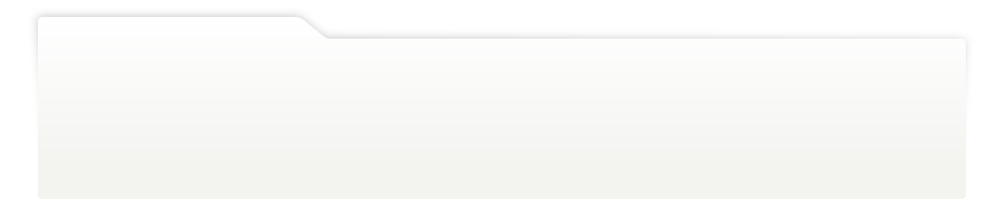
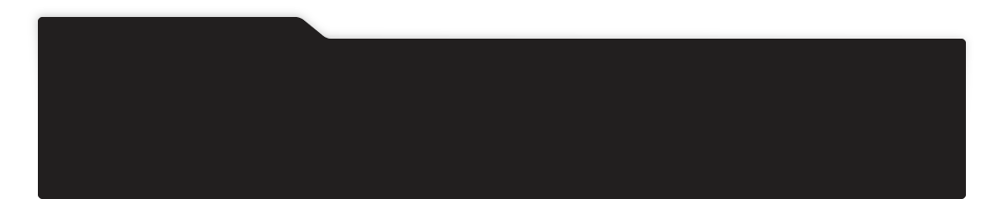
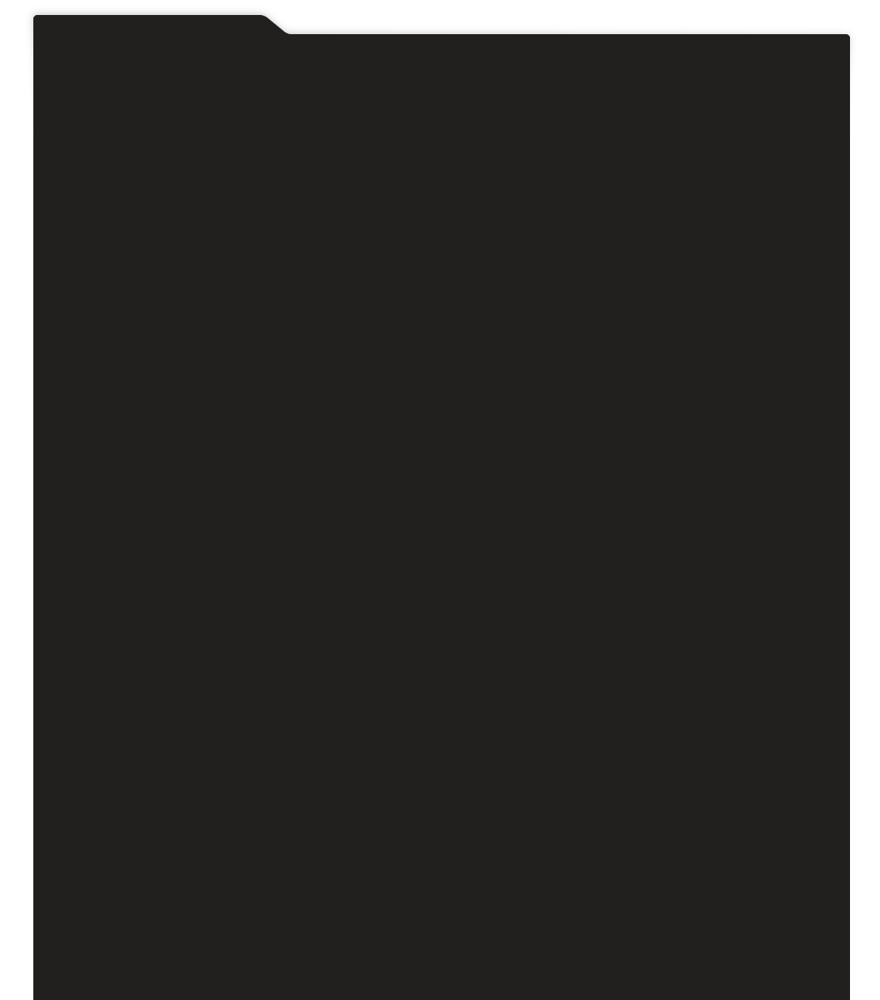
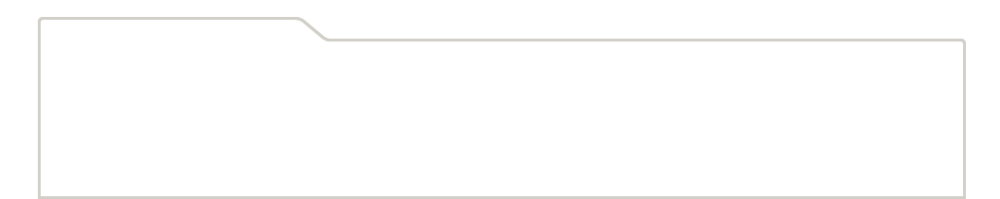
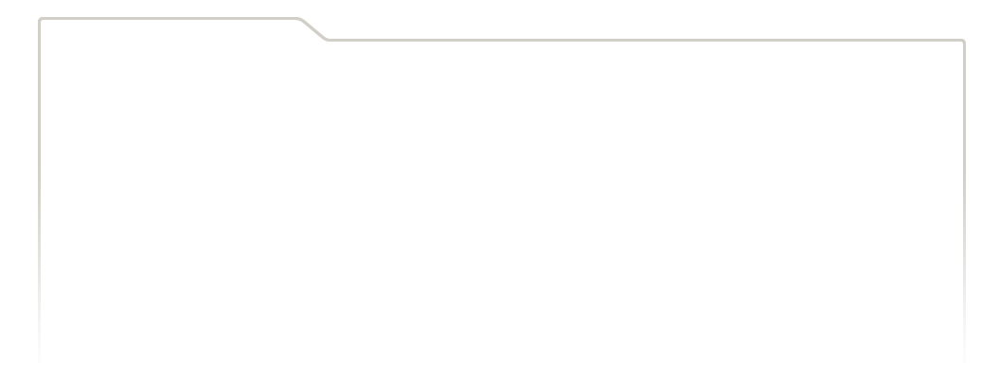
...
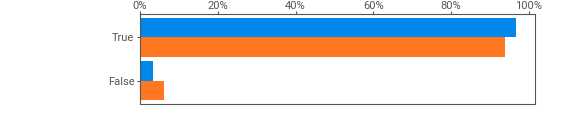
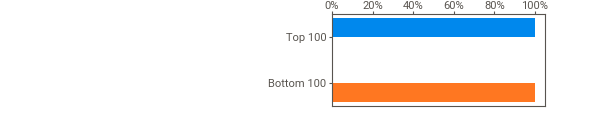
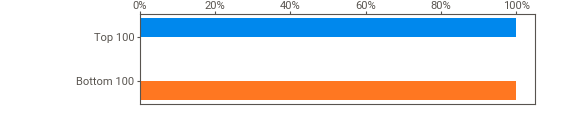
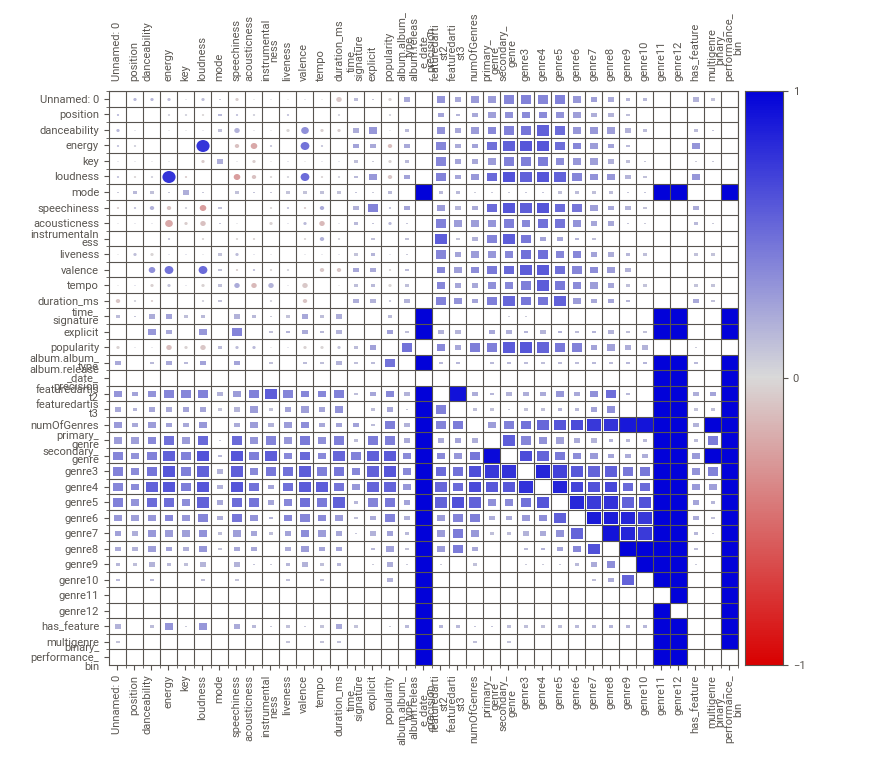
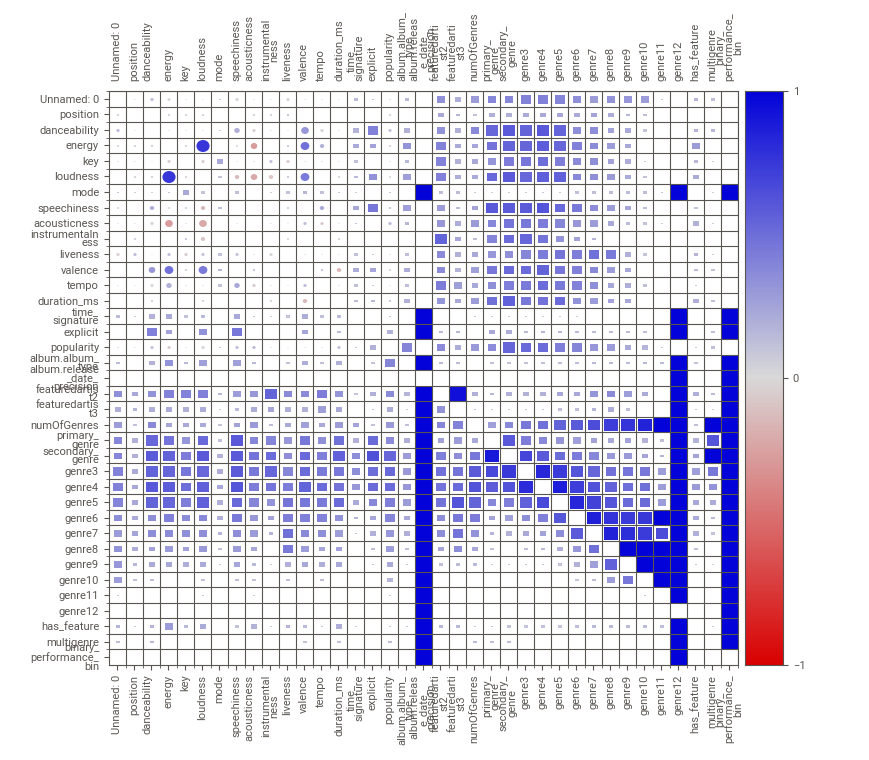

In [5]:
import sweetviz as sv

# 2017 Data Exploration
my_report = sv.compare_intra(df_data_3, df_data_3["binary_performance_bin"] == "Top 100", ["Top 100", "Bottom 100"])
my_report.show_notebook(h='Full')

#### 2018 Dataset
For the 2018 dataset, I've showcased the correlation/association matrix for the "Top 100" labeled data. All 5 datasets have this visualization, but it is easier to showcase the visualization on a single dataset because of how embedded formatting works for SweetViz.

                                             |          | [  0%]   00:00 -> (? left)


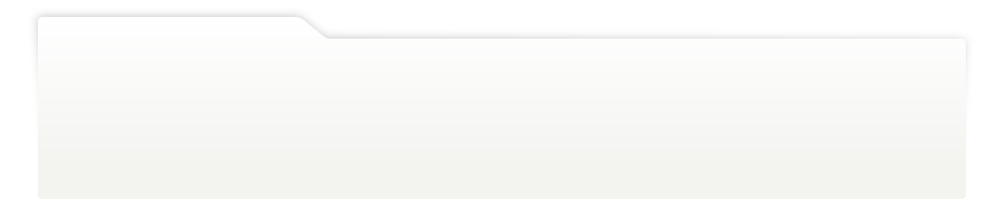
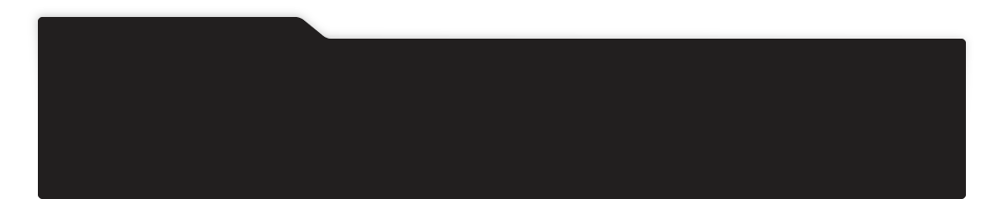
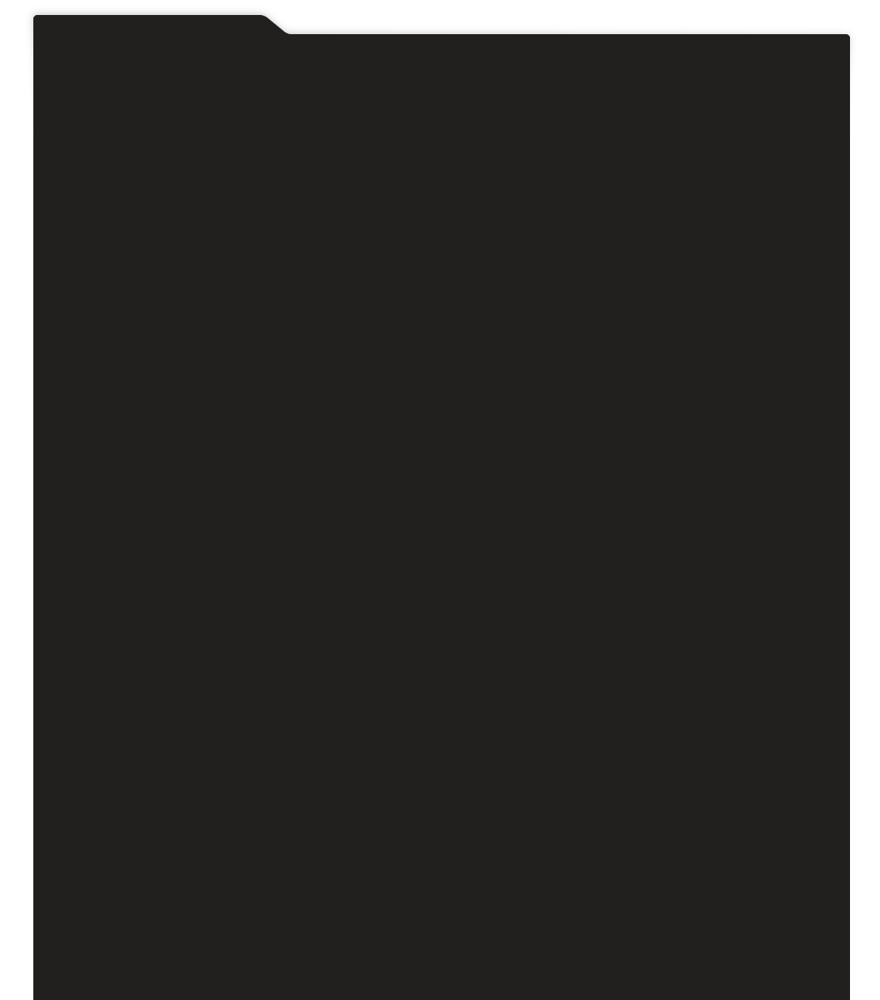
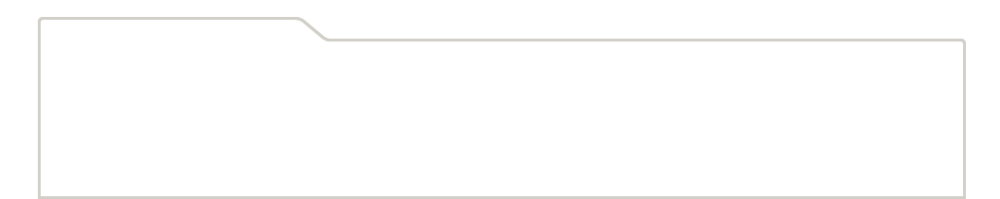
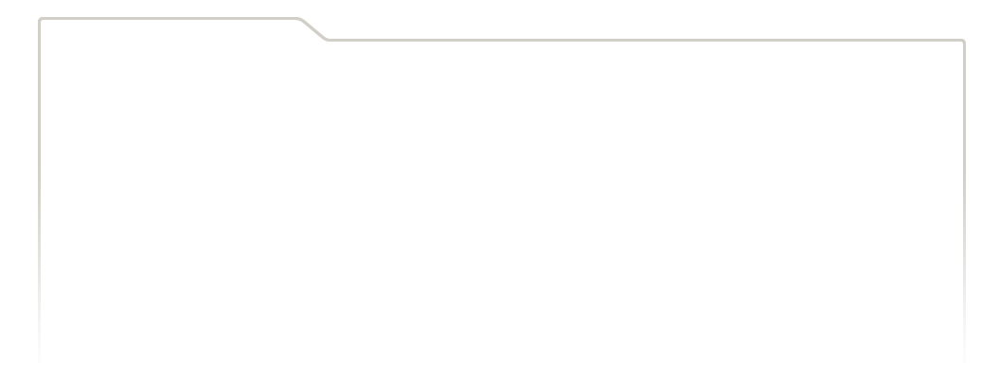
...
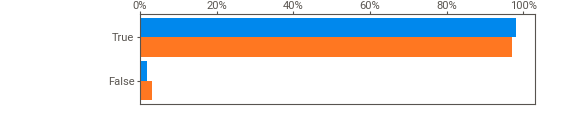
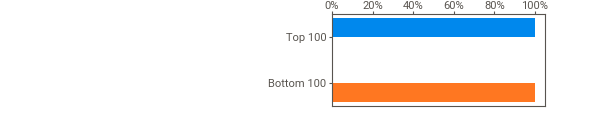
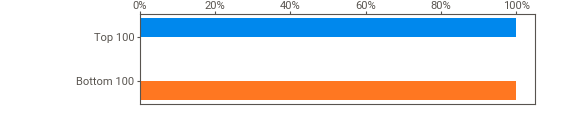
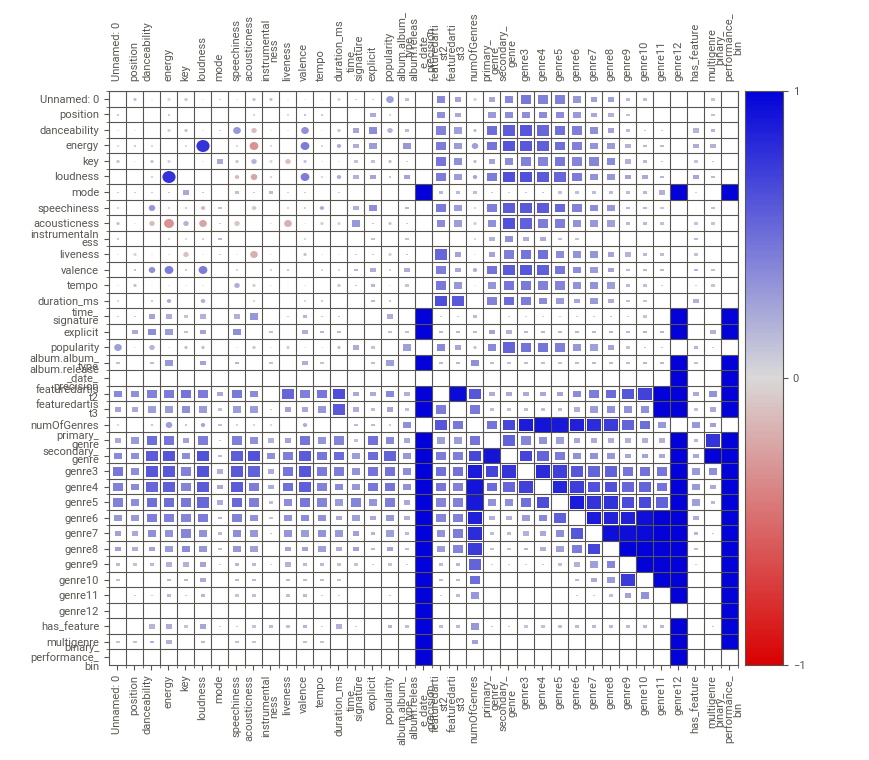
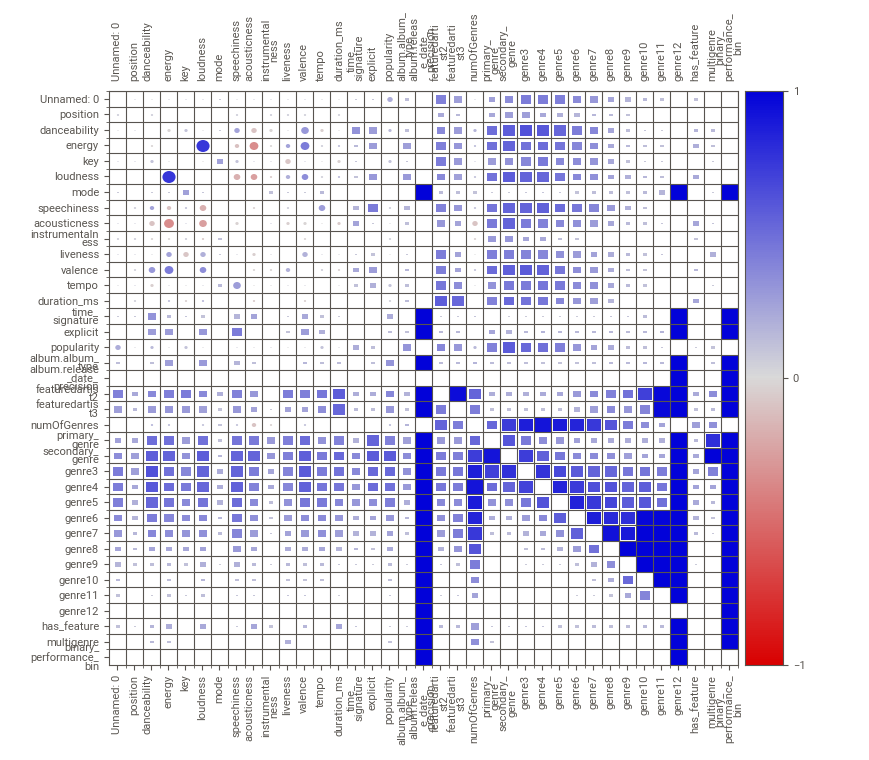

In [8]:
# 2018 Data Exploration

my_report = sv.compare_intra(df_data_4, df_data_4["binary_performance_bin"] == "Top 100", ["Top 100", "Bottom 100"])
my_report.show_notebook(h='Full')

#### 2019 Dataset
For the 2019 dataset, I've showcased the correlation/association matrix for the "Bottom 100" labeled data. Once again, all 5 datasets have this visualization, but it is easier to showcase the proof of concept on a single dataset because of how embedded formatting works for SweetViz.

                                             |          | [  0%]   00:00 -> (? left)


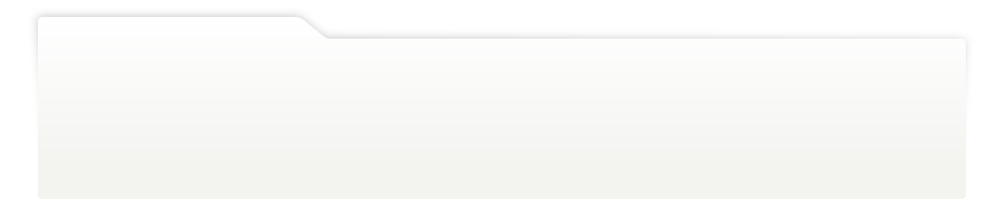
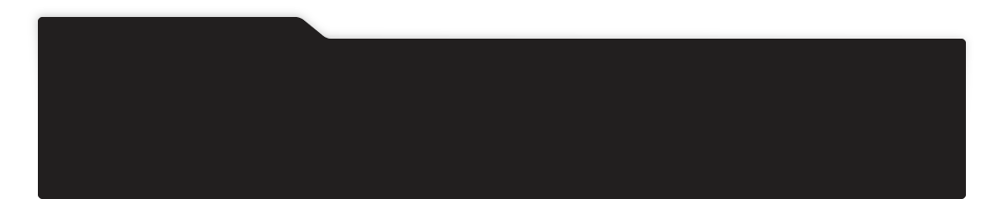
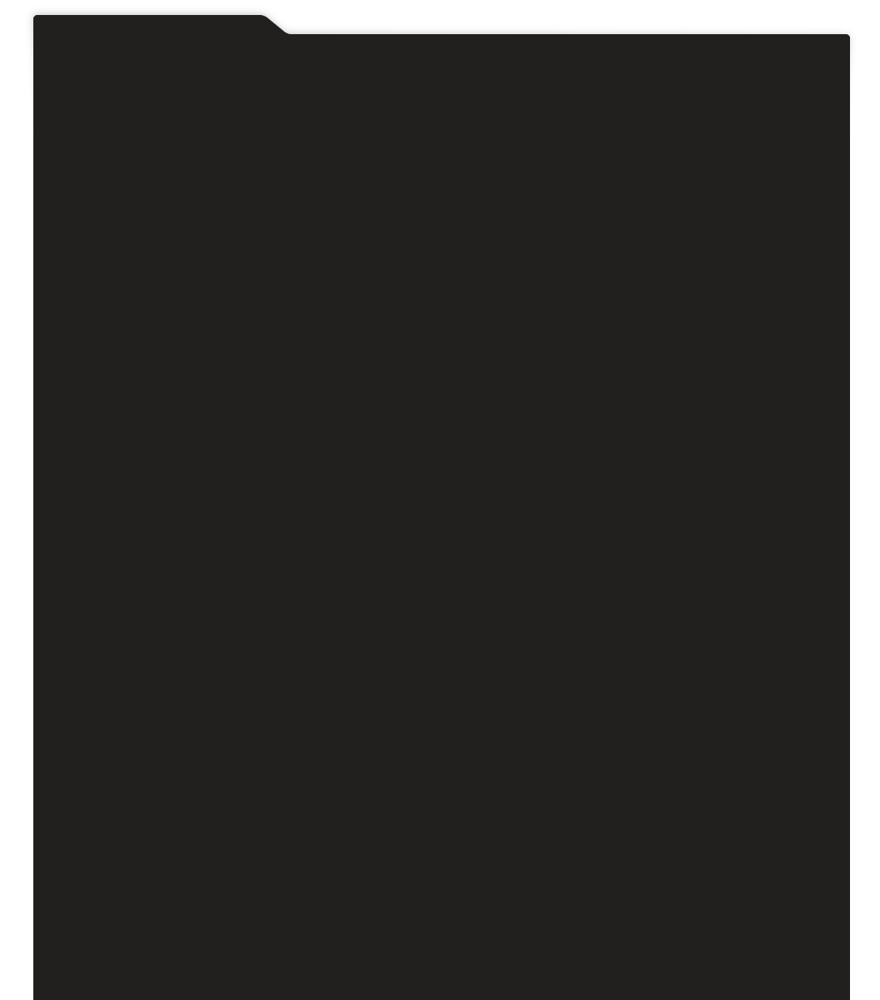
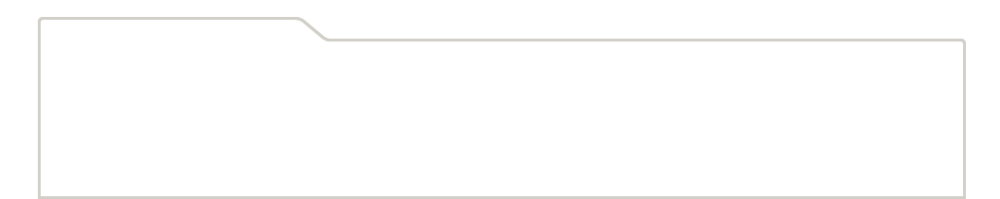
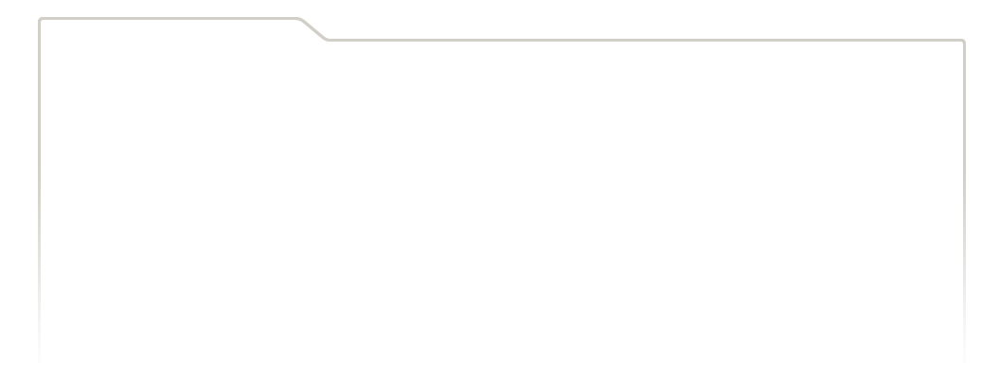
...
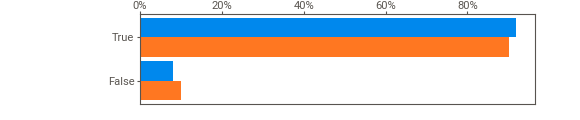
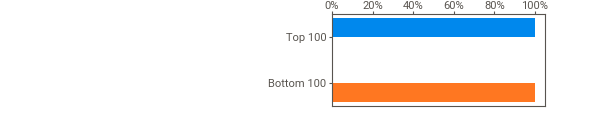
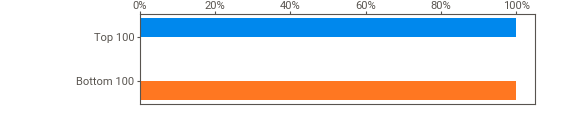
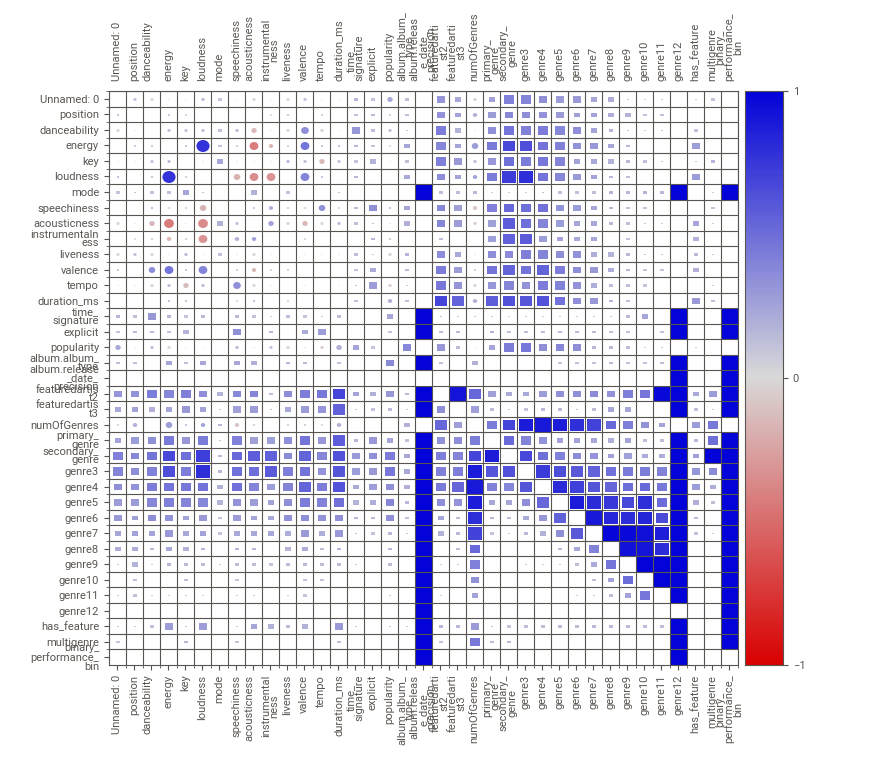
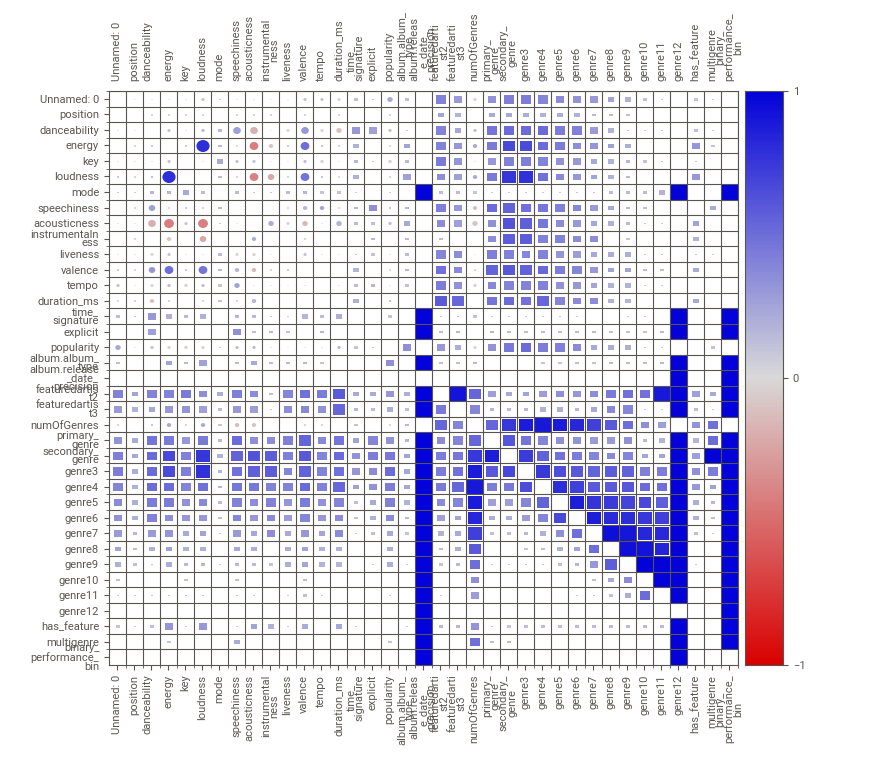

In [10]:
# 2019 Data Exploration

my_report = sv.compare_intra(df_data_5, df_data_5["binary_performance_bin"] == "Top 100", ["Top 100", "Bottom 100"])
my_report.show_notebook(h='Full')

#### 2020 Dataset
For the 2020 dataset, I've showcased how SweetViz details numerical features across the chosen label ("Top 100" vs "Bottom 100") using "danceability" as an example. Here we can see the percentile statistics, descriptive statistics regarding the distributions (ex:standard deviation, variance, mean, etc.), kurtosis and skew values, frequent values, and also an interactive histogram of both distributions. Again, all 5 datasets have this information, but it is easier to showcase the proof of concept on a single dataset because of how embedded formatting works for SweetViz.

                                             |          | [  0%]   00:00 -> (? left)


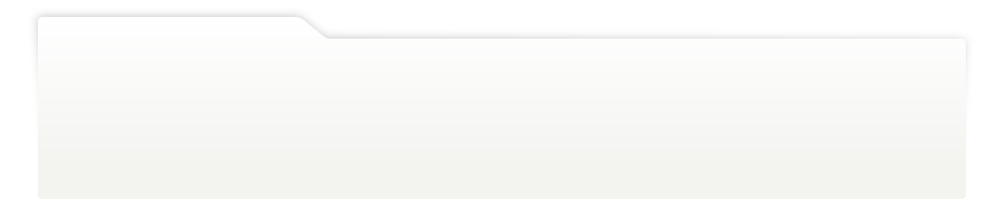
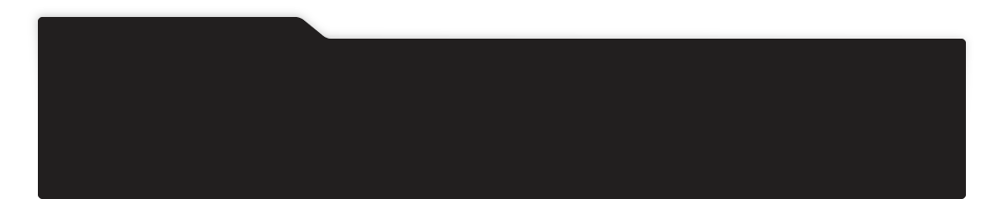
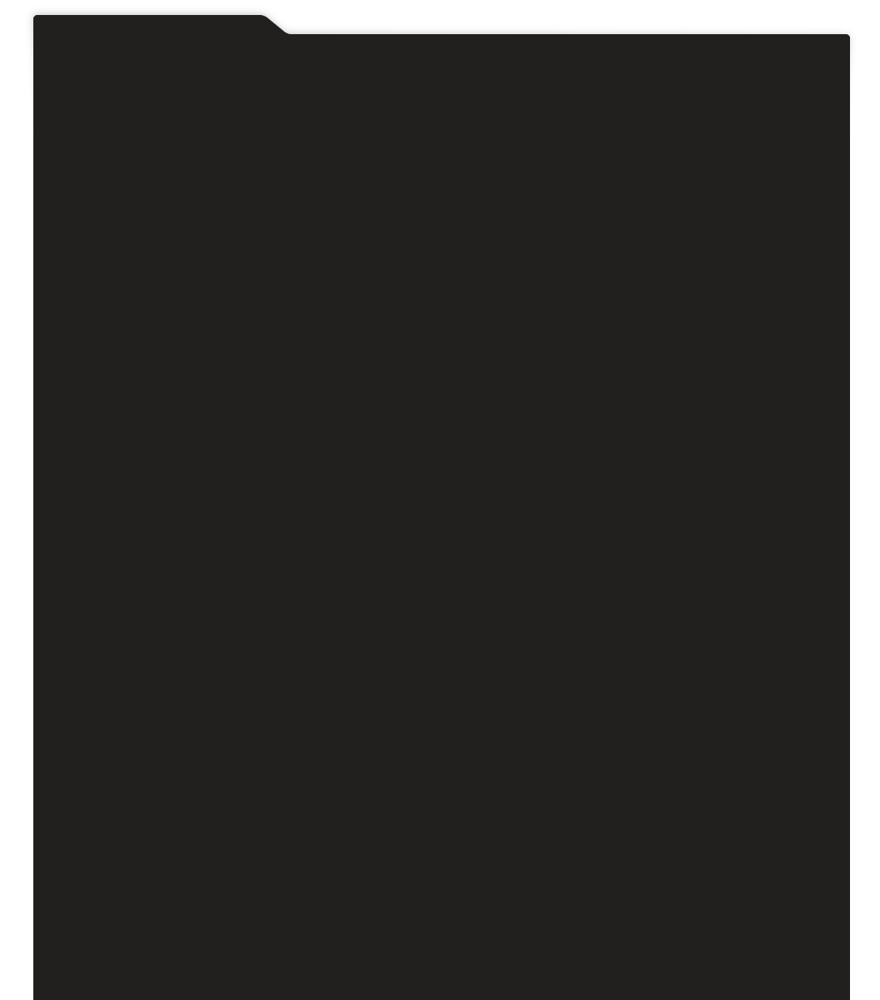
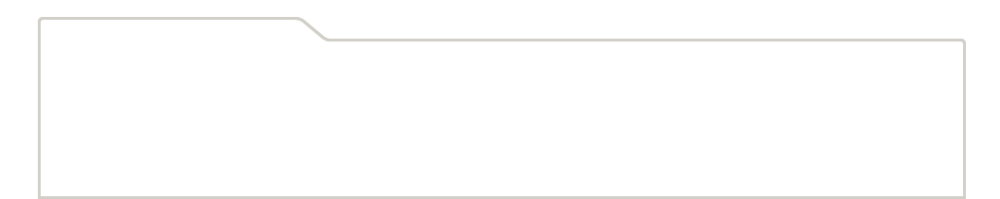
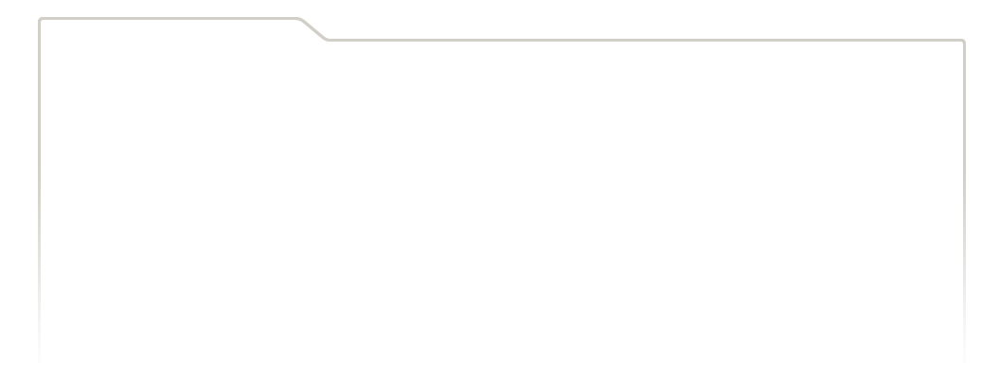
...
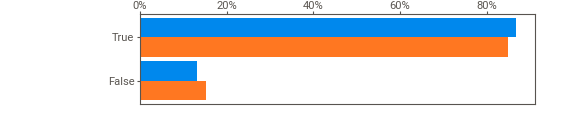
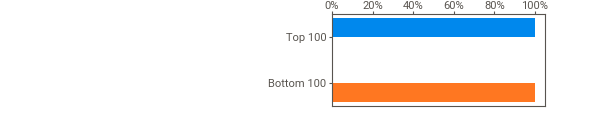
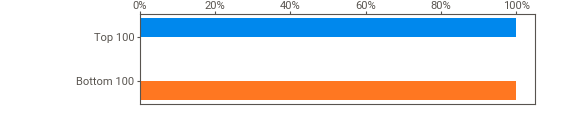
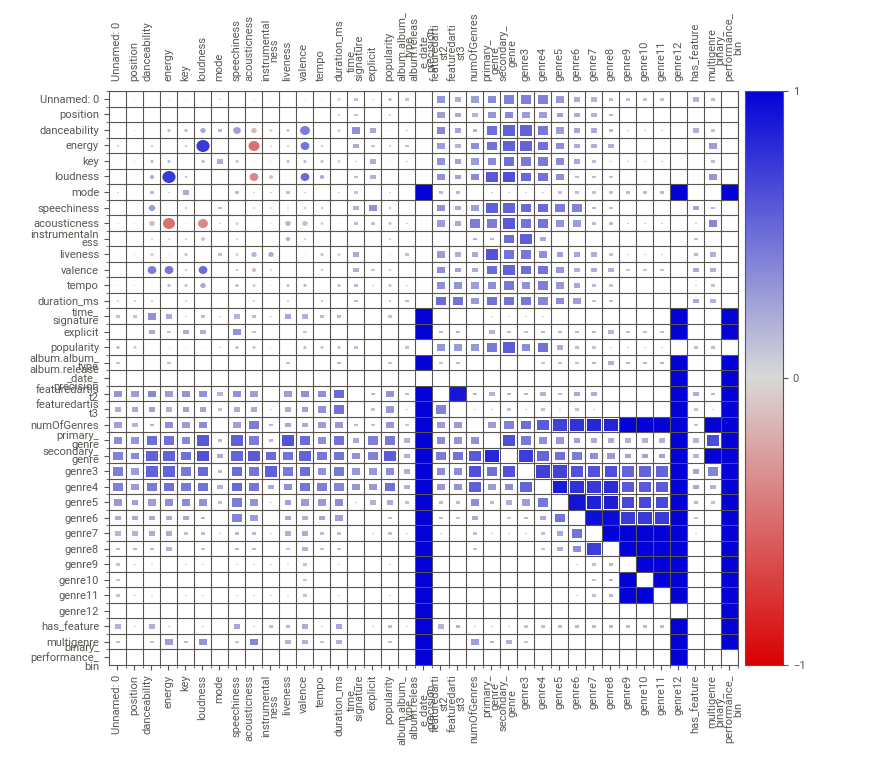
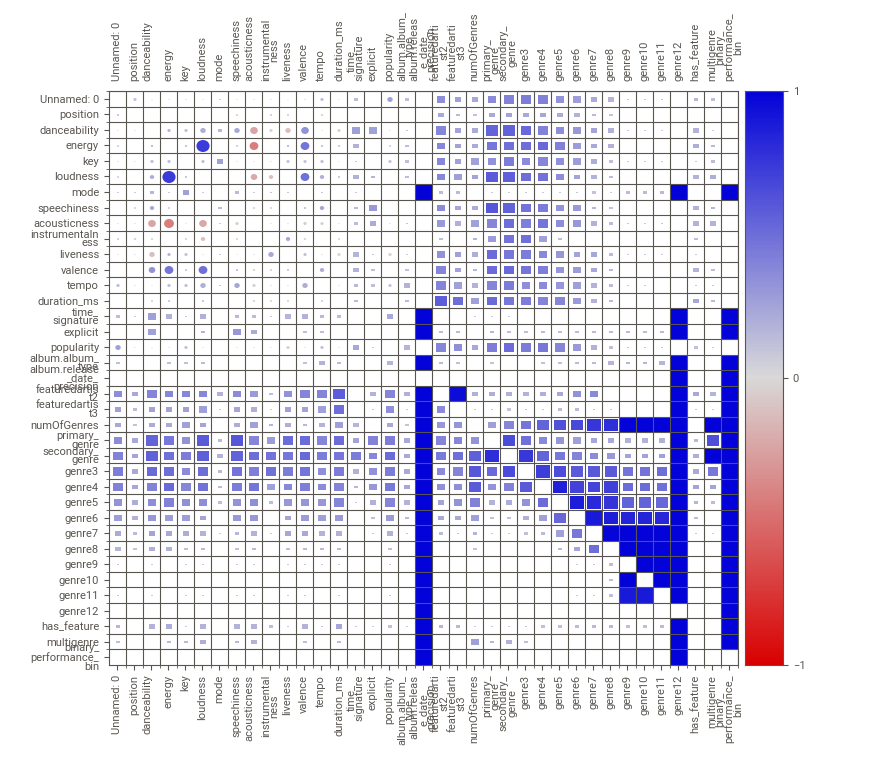

In [11]:
# 2020 Data Exploration

my_report = sv.compare_intra(df_data_6, df_data_6["binary_performance_bin"] == "Top 100", ["Top 100", "Bottom 100"])#, feature_config)
my_report.show_notebook(h='Full')

#### 2021 Dataset
For the 2021 dataset, I've showcased below how SweetViz details categorical variables. Namely, we see how particular "artist name", "feature artist", and "primary genre" values perform with regards to record count across labels ("Top 100" vs "Bottom 100"). 

When looked at in conjunction with the "Feature Importance" findings in the "training and evaluation" notebook, the interesting findings of note here are that the "Other" bin contains 55% of the records in the "Bottom 100" for "artist name", 26% for "featured artist", and 23% for "primary genre" (versus 18%, 6%, and 9% respectively for the "Top 100"). This same pattern can be seen across all 5 years.

What this implies is that songs from artists with weaker branding (i.e. not as well known) are more likely to be "Bottom 100" than songs from artists with stronger branding. The same applies for songs with "weakly branded" featured artists. Finally, songs with very niche "primary genres" tend to be in the "Bottom 100" more than the "Top 100" as well.

                                             |          | [  0%]   00:00 -> (? left)


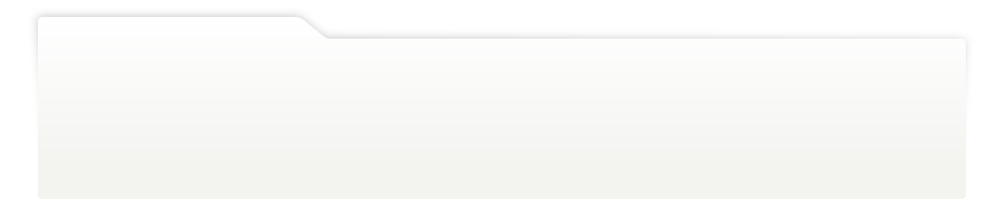
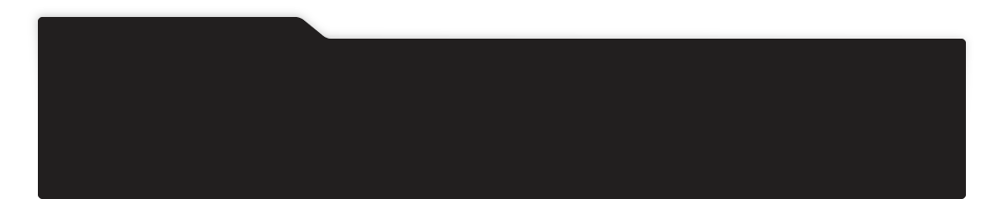
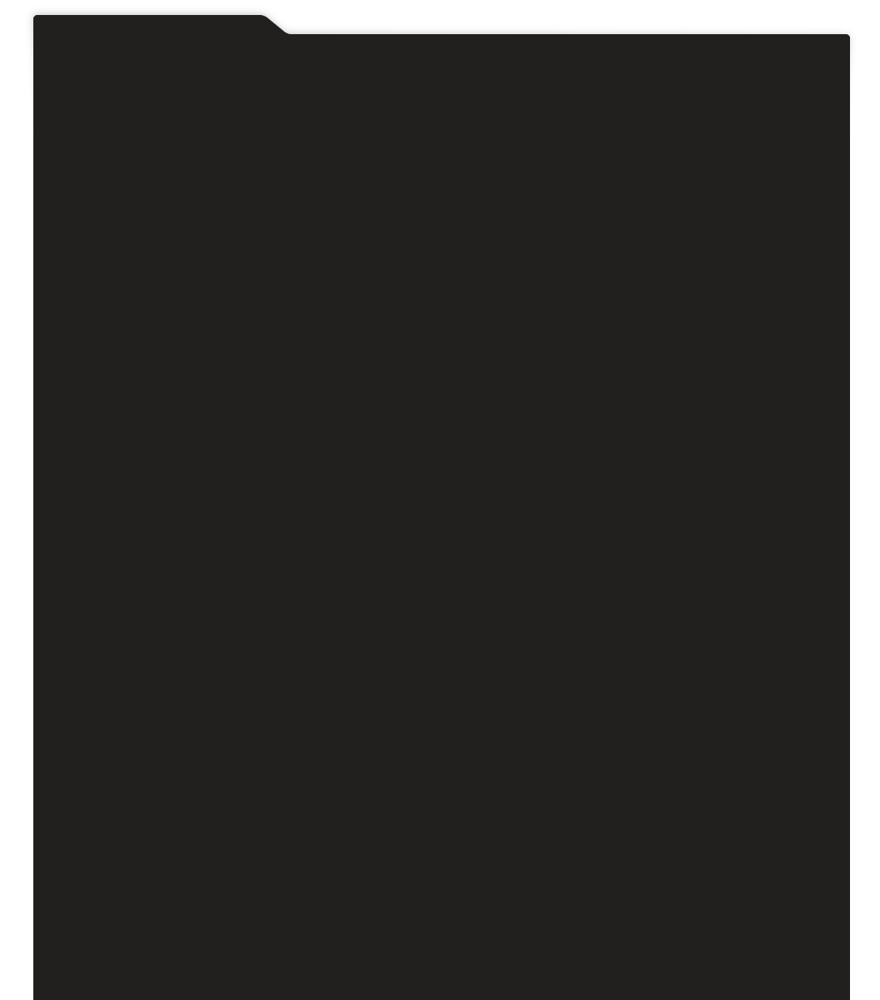
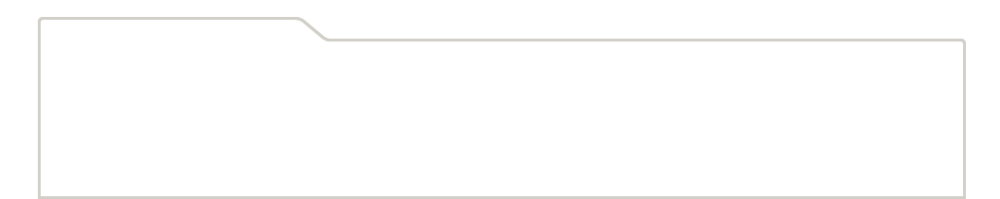
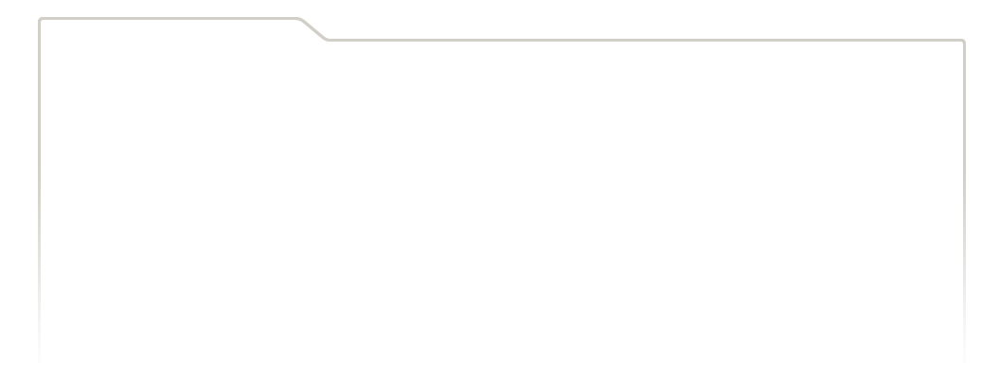
...
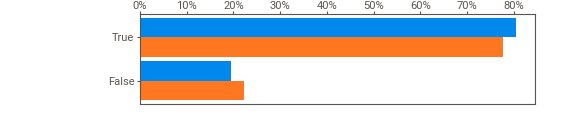
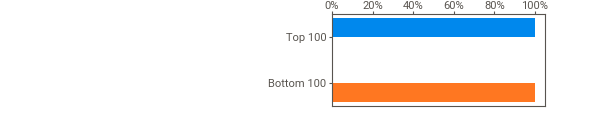
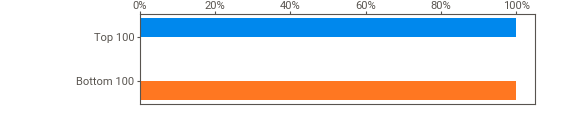
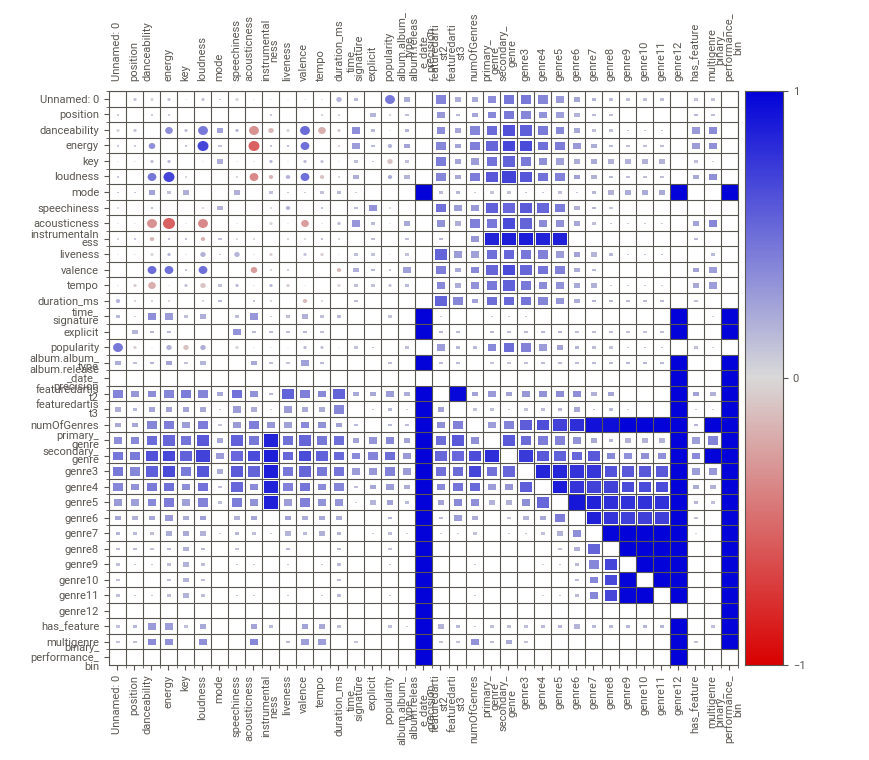
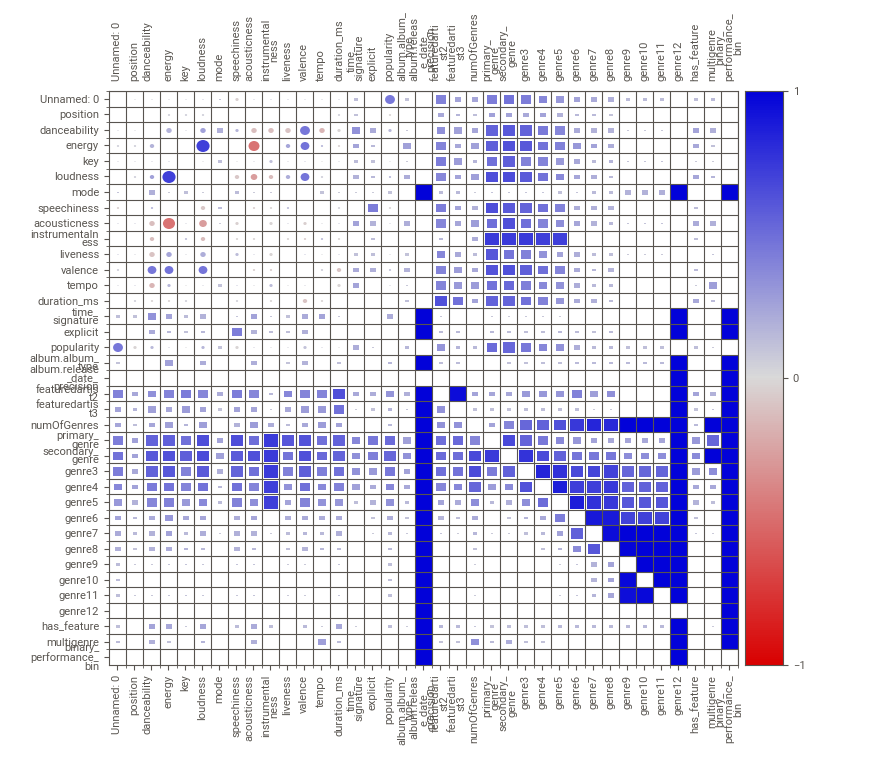

In [12]:
# 2021 Data Exploration

my_report = sv.compare_intra(df_data_7, df_data_7["binary_performance_bin"] == "Top 100", ["Top 100", "Bottom 100"])#, feature_config)
my_report.show_notebook(h='Full')

#### This concludes the ETL, Data Exploration, Feature Engineering, and Data Quality Assessment steps. The next Jupyter notebook in this project details the "Model Definition" step.